![](https://www.pata.org/wp-content/uploads/2014/09/TripAdvisor_Logo-300x119.png)
# Predict TripAdvisor Rating
## В этом соревновании нам предстоит предсказать рейтинг ресторана в TripAdvisor
**По ходу задачи:**
* Прокачаем работу с pandas
* Научимся работать с Kaggle Notebooks
* Поймем как делать предобработку различных данных
* Научимся работать с пропущенными данными (Nan)
* Познакомимся с различными видами кодирования признаков
* Немного попробуем [Feature Engineering](https://ru.wikipedia.org/wiki/Конструирование_признаков) (генерировать новые признаки)
* И совсем немного затронем ML
* И многое другое...   



### И самое важное, все это вы сможете сделать самостоятельно!

*Этот Ноутбук являетсся Примером/Шаблоном к этому соревнованию (Baseline) и не служит готовым решением!*   
Вы можете использовать его как основу для построения своего решения.

> что такое baseline решение, зачем оно нужно и почему предоставлять baseline к соревнованию стало важным стандартом на kaggle и других площадках.   
**baseline** создается больше как шаблон, где можно посмотреть как происходит обращение с входящими данными и что нужно получить на выходе. При этом МЛ начинка может быть достаточно простой, просто для примера. Это помогает быстрее приступить к самому МЛ, а не тратить ценное время на чисто инженерные задачи. 
Также baseline являеться хорошей опорной точкой по метрике. Если твое решение хуже baseline - ты явно делаешь что-то не то и стоит попробовать другой путь) 

В контексте нашего соревнования baseline идет с небольшими примерами того, что можно делать с данными, и с инструкцией, что делать дальше, чтобы улучшить результат.  Вообще готовым решением это сложно назвать, так как используются всего 2 самых простых признака (а остальные исключаются).

# import

In [1]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load in 

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)
import re
import math
from datetime import datetime as dt
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)
from sklearn.preprocessing import PolynomialFeatures
from sklearn.preprocessing import MinMaxScaler

import matplotlib.pyplot as plt
import seaborn as sns 
%matplotlib inline

# Загружаем специальный удобный инструмент для разделения датасета:
from sklearn.model_selection import train_test_split

# Input data files are available in the "../input/" directory.
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# Any results you write to the current directory are saved as output.

/kaggle/input/sf-dst-restaurant-rating/sample_submission.csv
/kaggle/input/sf-dst-restaurant-rating/main_task.csv
/kaggle/input/sf-dst-restaurant-rating/kaggle_task.csv


In [2]:
# всегда фиксируйте RANDOM_SEED, чтобы ваши эксперименты были воспроизводимы!
RANDOM_SEED = 42

In [3]:
# зафиксируем версию пакетов, чтобы эксперименты были воспроизводимы:
!pip freeze > requirements.txt

# Functions


In [4]:
# function which find duplicated values in column (1-has dupl, 0-doesn't have)
    def dup_col(col):
        duplicated_col = col.value_counts().loc[lambda x: x>1].index.tolist()
        new_col = []
        for x in col:
            if x in duplicated_col:
                new_col.append(1)
            else:
                new_col.append(0)
        return new_col

In [5]:
# function which calculates difference between last 2 reviews dates
def find_days(d):
    ln_d = len(d)
    if ln_d >1:
        new_d = sorted(d)
        ans = (new_d[ln_d-1]-new_d[ln_d-2]).days
        return ans

In [6]:
# check IQR
def iqr(dt, cl, pr=None):
    IQR = dt.loc[:, cl].quantile(0.75) - dt.loc[:, cl].quantile(0.25)
    perc25 = dt.loc[:, cl].quantile(0.25)
    perc75 = dt.loc[:, cl].quantile(0.75)
    lb = perc25 - 1.5*IQR
    hb = perc75 + 1.5*IQR

    if pd.isnull(pr):
        return [IQR, perc25, perc75, lb, hb, dt.loc[:, cl].max(), dt.loc[:, cl].min(), cl]
    else:
        print(cl,
              '25-й перцентиль: {},'.format(perc25),
              '75-й перцентиль: {},'.format(perc75),
              "IQR: {}, ".format(IQR),
              "Границы выбросов: [{lb}, {hb}].".format(lb=lb, hb=hb))

In [7]:
# hist function
# plots all hists together to have a look in general

# features - list of columns to plot
# rows, cols - number of rows & cols for hists
# fg1,2 - figure size
# b - number of bins per hist
def histograms_plot(dataframe, features, rows, cols, fg1, fg2, b):
    fig = plt.figure(figsize=(fg1, fg2))
    for i, feature in enumerate(features):
        ax = fig.add_subplot(rows, cols, i+1)
        dataframe[feature].hist(bins=b, ax=ax, facecolor='blue')
        ax.set_title(feature+" distribution", color='#1D0772')

        fig.tight_layout()
    plt.show()

In [8]:
# plot one hist to check outliers closer or just to look deeper

# tit - hist title
# rhb - reviewed highest border in 'Здравый смысл'
# rlb - reviewed lowest border in 'Здравый смысл'
# one of rhb or rlb could be missed

def hist_check(dth, b, tit, rhb=None, rlb=None):
    IQR = dth.quantile(0.75) - dth.quantile(0.25)
    perc25 = dth.quantile(0.25)
    perc75 = dth.quantile(0.75)
    lb = perc25 - 1.5*IQR
    hb = perc75 + 1.5*IQR

    print(
        '25-й перцентиль: {},'.format(perc25),
        '75-й перцентиль: {},'.format(perc75),
        "IQR: {}, ".format(IQR),
        "Границы выбросов: [{lb}, {hb}].".format(lb=lb, hb=hb))

    fig = plt.figure()
    dth.loc[dth.between(
        lb,
        hb)].hist(bins=b, label='IQR')

    if rlb != None and rhb != None:
        dth.loc[(rlb <= dth) & (dth <= rhb)].hist(
            alpha=0.5, bins=b,  label='Здравый смысл')
    elif pd.isnull(rlb) and rhb != None:
        dth.loc[dth <= rhb].hist(
            alpha=0.5, bins=b,  label='Здравый смысл')
    elif pd.isnull(rhb) and rlb != None:
        dth.loc[rlb <= dth].hist(
            alpha=0.5, bins=b,  label='Здравый смысл')

    plt.legend()
    plt.title(tit)
    return [lb, hb]

In [9]:
scaler= MinMaxScaler()

# DATA

In [10]:
DATA_DIR = '/kaggle/input/sf-dst-restaurant-rating/'
df_train = pd.read_csv(DATA_DIR+'/main_task.csv')
df_test = pd.read_csv(DATA_DIR+'kaggle_task.csv')
sample_submission = pd.read_csv(DATA_DIR+'/sample_submission.csv')

In [11]:
df_train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 40000 entries, 0 to 39999
Data columns (total 10 columns):
Restaurant_id        40000 non-null object
City                 40000 non-null object
Cuisine Style        30717 non-null object
Ranking              40000 non-null float64
Rating               40000 non-null float64
Price Range          26114 non-null object
Number of Reviews    37457 non-null float64
Reviews              40000 non-null object
URL_TA               40000 non-null object
ID_TA                40000 non-null object
dtypes: float64(3), object(7)
memory usage: 3.1+ MB


In [12]:
df_train.head(5)

,Restaurant_id,City,Cuisine Style,Ranking,Rating,Price Range,Number of Reviews,Reviews,URL_TA,ID_TA
0,id_5569,Paris,"['European', 'French', 'International']",5570.0,3.5,$$ - $$$,194.0,"[['Good food at your doorstep', 'A good hotel ...",/Restaurant_Review-g187147-d1912643-Reviews-R_...,d1912643
1,id_1535,Stockholm,NaN,1537.0,4.0,NaN,10.0,"[['Unique cuisine', 'Delicious Nepalese food']...",/Restaurant_Review-g189852-d7992032-Reviews-Bu...,d7992032
2,id_352,London,"['Japanese', 'Sushi', 'Asian', 'Grill', 'Veget...",353.0,4.5,$$$$,688.0,"[['Catch up with friends', 'Not exceptional'],...",/Restaurant_Review-g186338-d8632781-Reviews-RO...,d8632781
3,id_3456,Berlin,NaN,3458.0,5.0,NaN,3.0,"[[], []]",/Restaurant_Review-g187323-d1358776-Reviews-Es...,d1358776
4,id_615,Munich,"['German', 'Central European', 'Vegetarian Fri...",621.0,4.0,$$ - $$$,84.0,"[['Best place to try a Bavarian food', 'Nice b...",/Restaurant_Review-g187309-d6864963-Reviews-Au...,d6864963


In [13]:
df_test.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10000 entries, 0 to 9999
Data columns (total 9 columns):
Restaurant_id        10000 non-null object
City                 10000 non-null object
Cuisine Style        7693 non-null object
Ranking              10000 non-null float64
Price Range          6525 non-null object
Number of Reviews    9343 non-null float64
Reviews              9998 non-null object
URL_TA               10000 non-null object
ID_TA                10000 non-null object
dtypes: float64(2), object(7)
memory usage: 703.2+ KB


In [14]:
df_test.head(5)

,Restaurant_id,City,Cuisine Style,Ranking,Price Range,Number of Reviews,Reviews,URL_TA,ID_TA
0,id_0,Paris,"['Bar', 'Pub']",12963.0,$$ - $$$,4.0,"[[], []]",/Restaurant_Review-g187147-d10746918-Reviews-L...,d10746918
1,id_1,Helsinki,"['European', 'Scandinavian', 'Gluten Free Opti...",106.0,$$ - $$$,97.0,"[['Very good reviews!', 'Fine dining in Hakani...",/Restaurant_Review-g189934-d6674944-Reviews-Ra...,d6674944
2,id_2,Edinburgh,['Vegetarian Friendly'],810.0,$$ - $$$,28.0,"[['Better than the Links', 'Ivy Black'], ['12/...",/Restaurant_Review-g186525-d13129638-Reviews-B...,d13129638
3,id_3,London,"['Italian', 'Mediterranean', 'European', 'Vege...",1669.0,$$$$,202.0,"[['Most exquisite', 'Delicious and authentic']...",/Restaurant_Review-g186338-d680417-Reviews-Qui...,d680417
4,id_4,Bratislava,"['Italian', 'Mediterranean', 'European', 'Seaf...",37.0,$$$$,162.0,"[['Always the best in bratislava', 'Very good ...",/Restaurant_Review-g274924-d1112354-Reviews-Ma...,d1112354


In [15]:
sample_submission.head(5)

,Restaurant_id,Rating
0,id_0,2.0
1,id_1,2.5
2,id_2,4.0
3,id_3,1.0
4,id_4,4.0


In [16]:
sample_submission.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10000 entries, 0 to 9999
Data columns (total 2 columns):
Restaurant_id    10000 non-null object
Rating           10000 non-null float64
dtypes: float64(1), object(1)
memory usage: 156.4+ KB


In [17]:
# ВАЖНО! дря корректной обработки признаков объединяем трейн и тест в один датасет
df_train['sample'] = 1 # помечаем где у нас трейн
df_test['sample'] = 0 # помечаем где у нас тест
df_test['Rating'] = 0 # в тесте у нас нет значения Rating, мы его должны предсказать, по этому пока просто заполняем нулями

data = df_test.append(df_train, sort=False).reset_index(drop=True) # объединяем

In [18]:
# get number type columns
num_cols = data.select_dtypes(include='number').columns

In [19]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 50000 entries, 0 to 49999
Data columns (total 11 columns):
Restaurant_id        50000 non-null object
City                 50000 non-null object
Cuisine Style        38410 non-null object
Ranking              50000 non-null float64
Price Range          32639 non-null object
Number of Reviews    46800 non-null float64
Reviews              49998 non-null object
URL_TA               50000 non-null object
ID_TA                50000 non-null object
sample               50000 non-null int64
Rating               50000 non-null float64
dtypes: float64(3), int64(1), object(7)
memory usage: 4.2+ MB


Подробнее по признакам:
* City: Город 
* Cuisine Style: Кухня
* Ranking: Ранг ресторана относительно других ресторанов в этом городе
* Price Range: Цены в ресторане в 3 категориях
* Number of Reviews: Количество отзывов
* Reviews: 2 последних отзыва и даты этих отзывов
* URL_TA: страница ресторана на 'www.tripadvisor.com' 
* ID_TA: ID ресторана в TripAdvisor
* Rating: Рейтинг ресторана

In [20]:
data.sample(5)

,Restaurant_id,City,Cuisine Style,Ranking,Price Range,Number of Reviews,Reviews,URL_TA,ID_TA,sample,Rating
14163,id_8892,Paris,"['Chinese', 'Asian']",8894.0,$$ - $$$,117.0,"[['Incredible like French refined cuisine', ""D...",/Restaurant_Review-g187147-d1819766-Reviews-Sh...,d1819766,1,3.5
37688,id_2643,London,"['Seafood', 'British', 'Gluten Free Options']",2648.0,$$ - $$$,171.0,"[['A City institution', 'Tradition maintained'...",/Restaurant_Review-g186338-d720641-Reviews-Swe...,d720641,1,4.0
34130,id_2360,Munich,NaN,2377.0,NaN,3.0,"[[], []]",/Restaurant_Review-g187309-d8725507-Reviews-Aq...,d8725507,1,3.5
39387,id_323,Luxembourg,"['Mediterranean', 'European', 'Spanish']",324.0,$$ - $$$,34.0,"[['Bad service and food', 'Amazing fresh food'...",/Restaurant_Review-g190356-d743863-Reviews-Rap...,d743863,1,3.5
44613,id_3126,Lisbon,"['Italian', 'Brazilian', 'European', 'Portugue...",3129.0,NaN,13.0,"[['NIce Food!', 'Disappointing!'], ['10/19/201...",/Restaurant_Review-g189158-d3569849-Reviews-Me...,d3569849,1,3.5


In [21]:
data.Reviews[1]

"[['Very good reviews!', 'Fine dining in Hakaniemi'], ['12/05/2017', '10/29/2017']]"

Дубликатов найдено: 0


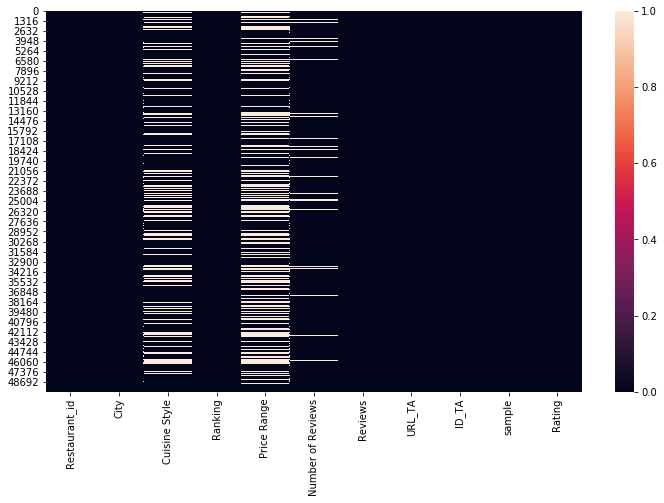

In [22]:
# find if there were any duplicates in the data
print("Дубликатов найдено:", data.duplicated(keep=False).sum())


# Look at the nan data in general
plt.subplots(figsize=(12, 7))
sns.heatmap(data.isnull())

We have nan values only in Cuisine style, price range, number of reviews. If look deeper in review - there we also have nan values


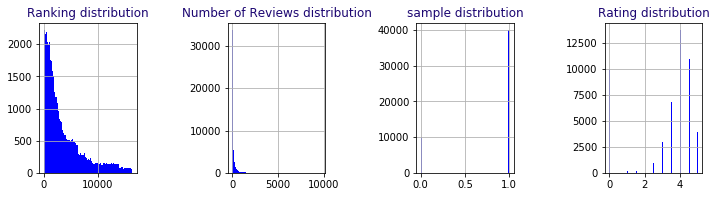

In [23]:
# plot & look at variability of all quantitative data in general
histograms_plot(data, num_cols, 4, 4, fg1=10, fg2=10, b=100)

In [24]:
# prepare all IQR to find columns with outliers
al = []
for col in num_cols:
    al.append(iqr(data, col))
    
# find columns with outliers => NaN in outlier column
all_borders = pd.DataFrame(al, columns=['IQR', 'perc25', 'perc75', 'lb', 'hb', 'max_v', 'min_v', 'data'])
all_borders.loc[(all_borders.hb >= all_borders.max_v) & (
    all_borders.lb <= all_borders.min_v), 'outlier'] = 'no'
all_borders

,IQR,perc25,perc75,lb,hb,max_v,min_v,data,outlier
0,4269.0,972.0,5241.0,-5431.50,11644.50,16444.0,1.0,Ranking,NaN
1,106.0,9.0,115.0,-150.00,274.00,9660.0,2.0,Number of Reviews,NaN
2,0.0,1.0,1.0,1.00,1.00,1.0,0.0,sample,NaN
3,1.5,3.0,4.5,0.75,6.75,5.0,0.0,Rating,NaN


seems that Ranking & Number of Reviews have outliers

# Cleaning and Prepping Data
Обычно данные содержат в себе кучу мусора, который необходимо почистить, для того чтобы привести их в приемлемый формат. Чистка данных — это необходимый этап решения почти любой реальной задачи.   
![](https://analyticsindiamag.com/wp-content/uploads/2018/01/data-cleaning.png)

### 1. Обработка NAN  и Обработка признаков
У наличия пропусков могут быть разные причины, но пропуски нужно либо заполнить, либо исключить из набора полностью. Но с пропусками нужно быть внимательным, **даже отсутствие информации может быть важным признаком!**   
По этому перед обработкой NAN лучше вынести информацию о наличии пропуска как отдельный признак 

In [25]:
data.nunique(dropna=False)

Restaurant_id        13094
City                    31
Cuisine Style        10732
Ranking              12975
Price Range              4
Number of Reviews     1574
Reviews              41858
URL_TA               49963
ID_TA                49963
sample                   2
Rating                  10
dtype: int64

### Number of Reviews

In [26]:
# create new column: if  Number_of_Reviews consist nan
data['Number_of_Reviews_isNAN'] = pd.isna(data['Number of Reviews']).astype('uint8')
data['Number_of_Reviews_isNAN'].value_counts()

0    46800
1     3200
Name: Number_of_Reviews_isNAN, dtype: int64

25-й перцентиль: 9.0, 75-й перцентиль: 115.0, IQR: 106.0,  Границы выбросов: [-150.0, 274.0].


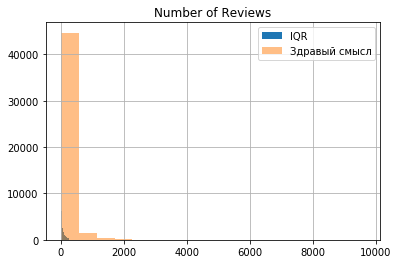

In [27]:
# need to look deeper at the data at first
col_name = 'Number of Reviews'
bord = hist_check(data[col_name], 17, tit=col_name, rhb=10000)

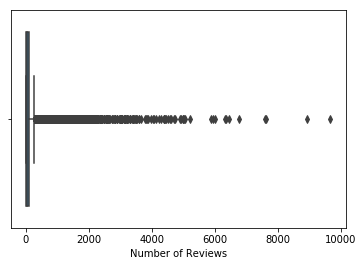

In [28]:
# look at the Number of Reviews outliers
sns.boxplot(data['Number of Reviews'])

according to the boxplot it seems that values higher than  5000 are real outliers

In [29]:
# according to the boxplot it seems that values higher than 5000 are real outliers
# will replace higher values by 5000
data['Number of Reviews'] = data['Number of Reviews'].apply(lambda x: 5000 if x > 5000 else x)

In [30]:
# Fill Number of Reviews missing values by median per City
# for each column with nan's median,median per city, 0 filling was tried - selected the best with better mae
data["Number of Reviews"] = data.groupby("City")['Number of Reviews']\
.transform(lambda x: x.fillna(round(x.mean())))

25-й перцентиль: 3.321928094887362, 75-й перцентиль: 6.954196310386875, IQR: 3.6322682154995127,  Границы выбросов: [-2.1264742283619067, 12.402598633636144].


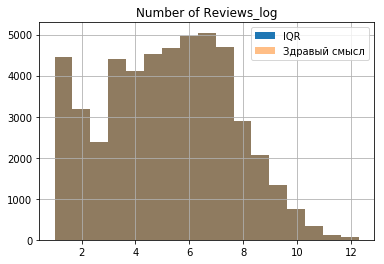

In [31]:
# add log2 column to make normal distribution - leads to worse mae, will remove in the end
data["Number of Reviews_log"] = np.log2(data["Number of Reviews"])
col_name = 'Number of Reviews_log'
bord = hist_check(data[col_name], 17, tit=col_name, rhb=np.log2(10000))

### Cuisine Style

In [32]:
# create Cuisine style dummy variable - worse MAE
# d_cus = data['Cuisine Style'].apply(lambda x: str(x).strip('[]')).str.get_dummies(sep=', ')
# data = data.merge(d_cus, left_index = True, right_index = True)

In [33]:
# make column easy to work
data['Cuisine Style'] = data['Cuisine Style']\
                        .apply(lambda x:  np.nan if pd.isna(x) else str(x).strip('[]').replace("'","").split(", "))



In [34]:
# look at the list of most spread cuisines
data['Cuisine Style'].explode().value_counts(ascending=False)

Vegetarian Friendly    14021
European               12561
Mediterranean           7820
Italian                 7433
Vegan Options           5684
Gluten Free Options     5185
Bar                     4094
French                  3970
Asian                   3786
Pizza                   3502
Spanish                 3456
Pub                     3058
Cafe                    2883
Fast Food               2122
British                 1992
International           1966
Seafood                 1878
Japanese                1860
Central European        1727
American                1642
Sushi                   1450
Chinese                 1446
Portuguese              1385
Indian                  1328
Middle Eastern           980
Thai                     923
Wine Bar                 877
German                   820
Halal                    773
Greek                    768
Healthy                  758
Fusion                   748
Czech                    745
Steakhouse               729
Barbecue      

In [35]:
# create most spread cuisine dummy (select top 3, as top 5 leads to not so good mae) 
cus_list = data['Cuisine Style'].explode().value_counts(ascending=False)[:3].index.tolist()
for col in cus_list:
    if col not in data.columns:
        data[col] = data['Cuisine Style'].apply(lambda x: 1 if type(x)!=float and col in x   else 0)

# create column if all cuisines are not in top 3 list
data['Cuisine_else_all'] = data['Cuisine Style']\
                            .apply(lambda x: 1 if type(x)!=float and all([cus not in cus_list for cus in x]) else 0)

# both lead to worse MAE

# if any cuisines are not in top 3 list
# data['Cuisine_else_any'] = data['Cuisine Style'].apply(lambda x: 1 if type(x)!=float and any([cus not in cus_list for cus in x])   else 0)

# if Cuisine is nan
# data['Cuisine_Nan'] = np.where(pd.isna(data['Cuisine Style'].values), 1, 0) 


In [36]:
# calculate number of cuisines (1 if nan)
data['Cuisine_Style_number'] = data['Cuisine Style']\
                                .apply(lambda x: 1 if type(x)==float and pd.isna(x)  else len(x))

### Price Range

In [37]:
# create new column: if price range consist nan
data['Price_Range_nan'] = pd.isna(data['Price Range']).astype('uint8')


In [38]:
data['Price Range'].value_counts()

$$ - $$$    23041
$            7816
$$$$         1782
Name: Price Range, dtype: int64

По описанию 'Price Range' это - Цены в ресторане.  
Их можно поставить по возрастанию (значит это не категориальный признак). А это значит, что их можно заменить последовательными числами, например 1,2,3  


In [39]:
# encode price range + fill nan's by mean per city 
data['New_Price_Range'] = data['Price Range'].map({'$$ - $$$':2, '$':1, '$$$$':3})

data['New_Price_Range'] = data.groupby("City")['New_Price_Range']\
                            .transform(lambda x: x.fillna(round(x.mean()))).astype(int)

### ID_TA

In [40]:
# create id_ta without d
data['ID_TA_n'] = data.ID_TA.apply(lambda x: x[1:]).astype(str).astype(int)



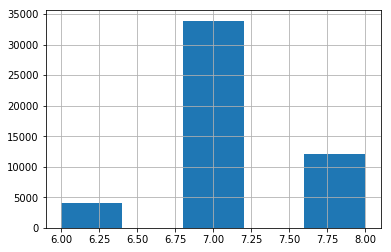

In [41]:
# look at the ID_TA length 
data.ID_TA.apply(lambda x: len(x[1:])).hist(bins=5)

In [42]:
# calculate len of id_ta - worse mae
# data['ID_TA_len'] = data.ID_TA.apply(lambda x: len(x[1:]))

In [43]:
# check what duplicates we have here
data.ID_TA.value_counts().unique()

array([2, 1])

In [44]:
# create column with id_ta which has duplicates 
data['ID_TA_dup'] = dup_col(data.ID_TA)

![](https://cs10.pikabu.ru/post_img/2018/09/06/11/1536261023140110012.jpg)

### Reviews
I worked only with Review dates

In [45]:
# create column with review dates
pat = re.compile('\'\d+\/\d+\/\d+\'?')
data['Review_date'] = data.Reviews\
                    .apply(lambda x: [] if pd.isna(x) else re.findall(pat,x) )\
                    .apply(lambda y:[pd.to_datetime(item) for item in y ])

In [46]:
# calculate difference of days between last two reviews 
data['Review_date_dif'] = data.Review_date.apply(lambda x: find_days(x))

# create column with nan in Review_date_dif - worse mae   
# data['Review_date_dif_isNAN'] = pd.isna(data['Review_date_dif']).astype('uint8')

25-й перцентиль: 20.0, 75-й перцентиль: 173.0, IQR: 153.0,  Границы выбросов: [-209.5, 402.5].


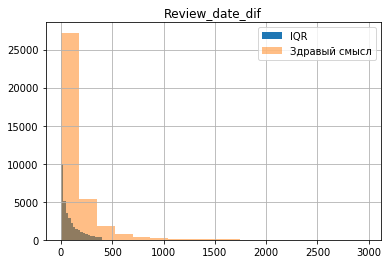

In [47]:
# look at the Review_date_dif
col_name = 'Review_date_dif'
bord = hist_check(data[col_name], 17, tit=col_name, rhb = 3000)

25-й перцентиль: 4.392317422778761, 75-й перцентиль: 7.442943495848728, IQR: 3.0506260730699672,  Границы выбросов: [-0.18362168682619018, 12.01888260545368].


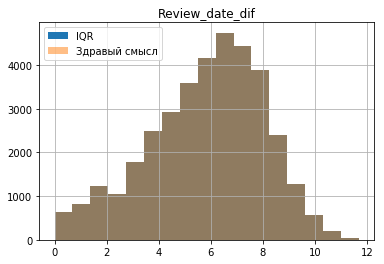

In [48]:
# look at log2 column in order to make normal distribution 
col_name = 'Review_date_dif'
bord = hist_check(np.log2(data[col_name]+1), 17, tit=col_name, rhb = 3000)

In [49]:
# try different Review_date_dif na filling
# data['Review_date_dif'] = data.groupby("City")['Review_date_dif']\
# .transform(lambda x: x.fillna(round(x.mean()))).astype(int)
data['Review_date_dif'].fillna(round(data['Review_date_dif'].mean()), inplace=True)


# create column with last review date & todays difference - worse mae
# td = pd.to_datetime("today")
# data['last_rev_date'] = data.Review_date.apply(lambda x: np.nan if not x else (td-max(x)).days)


# create column with last review date & the latest review at all difference
data['last_rev_date'] = data.Review_date.apply(lambda x: np.nan if not x else max(x))
md = max(data['last_rev_date'].dropna())
data['last_rev_date'] = data['last_rev_date'].apply(lambda x: (md-x).days)


# try last review date to timestamp & rescale - worse mae
# data['last_rev_date'] = data.Review_date.apply(lambda x: np.nan if not x else max(x).timestamp())#.values
# data['last_rev_date'] = scaler.fit_transform(data[['last_rev_date']]).flatten().tolist()



25-й перцентиль: 79.0, 75-й перцентиль: 337.0, IQR: 258.0,  Границы выбросов: [-308.0, 724.0].


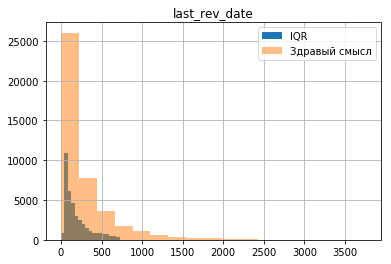

In [50]:
# look at the last_rev_date
col_name = 'last_rev_date'
bord = hist_check(data[col_name], 17, tit=col_name, rhb = 5000)

In [51]:
# try different last_rev_date na filling
# data['last_rev_date'].fillna(0, inplace=True)
data['last_rev_date'].fillna(round(data['last_rev_date'].mean()), inplace=True)
# data['last_rev_date'] = data.groupby("City")['last_rev_date']\
# .transform(lambda x: x.fillna(round(x.mean()))).astype(int)

25-й перцентиль: 6.523561956057013, 75-й перцентиль: 8.184875342908283, IQR: 1.66131338685127,  Границы выбросов: [4.031591875780109, 10.676845423185188].


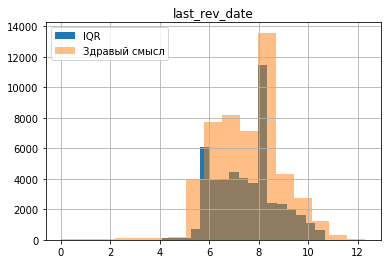

In [52]:
# look at log2 column in order to make normal distribution 
col_name = 'last_rev_date'
bord = hist_check(np.log2(data[col_name]+1), 17, tit=col_name, rhb = 5000)

In [53]:
# get log2 last_rev_date & Review_date_dif in order to make normal distribution 
data['last_rev_date'] = np.log2(data['last_rev_date']+1)
data['Review_date_dif'] = np.log2(data['Review_date_dif']+1)

# EDA 
[Exploratory Data Analysis](https://ru.wikipedia.org/wiki/Разведочный_анализ_данных) - Анализ данных
На этом этапе мы строим графики, ищем закономерности, аномалии, выбросы или связи между признаками.
В общем цель этого этапа понять, что эти данные могут нам дать и как признаки могут быть взаимосвязаны между собой.
Понимание изначальных признаков позволит сгенерировать новые, более сильные и, тем самым, сделать нашу модель лучше.
![](https://miro.medium.com/max/2598/1*RXdMb7Uk6mGqWqPguHULaQ.png)

### Ranking

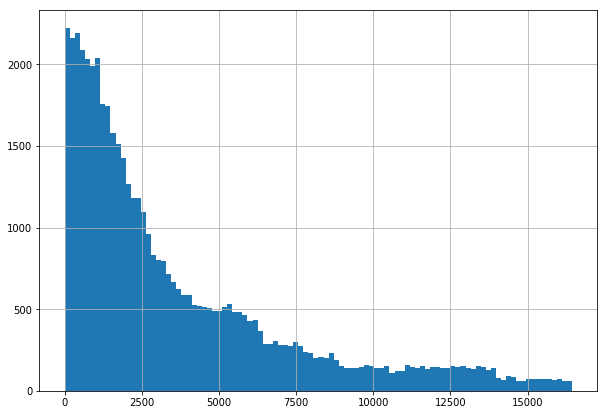

In [54]:
plt.rcParams['figure.figsize'] = (10,7)
data['Ranking'].hist(bins=100)

У нас много ресторанов, которые не дотягивают и до 2500 места в своем городе, а что там по городам?

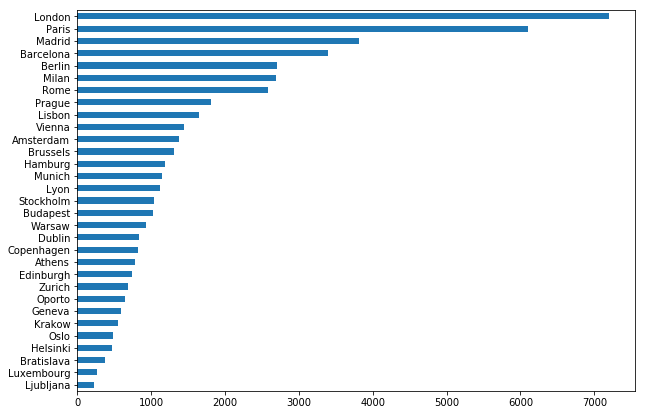

In [55]:
data['City'].value_counts(ascending=True).plot(kind='barh')

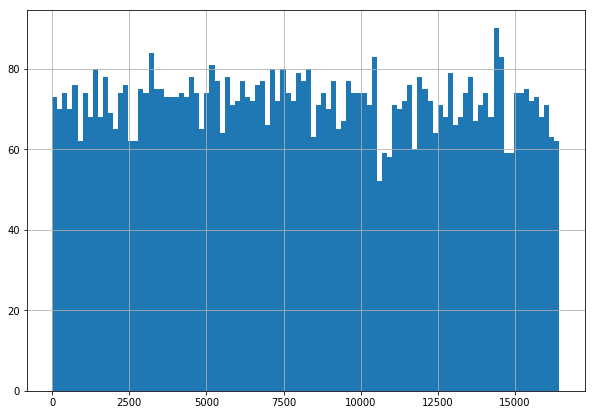

In [56]:
data['Ranking'][data['City'] =='London'].hist(bins=100)

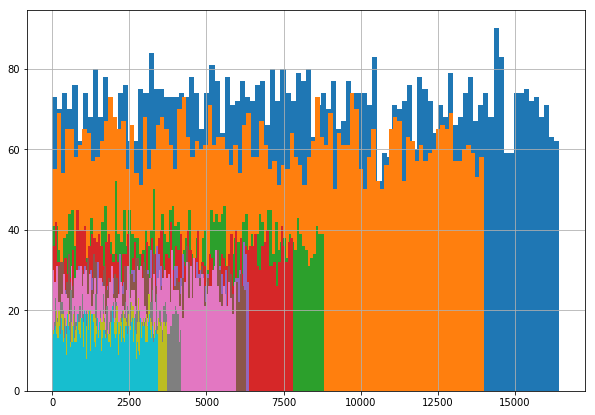

In [57]:
# look at top 10 Cities - we've seen the correlation between city & ranking
for x in (data['City'].value_counts())[0:10].index:
    data['Ranking'][data['City'] == x].hist(bins=100)
plt.show()

we could see that ranking depends on city, as different cities have different number of restaurants

In [58]:
# look at the restaurant id duplicates
data.Restaurant_id.value_counts()[:10]

id_633    19
id_227    19
id_871    19
id_436    19
id_534    18
id_344    18
id_585    18
id_321    18
id_430    18
id_71     18
Name: Restaurant_id, dtype: int64

In [59]:
# rest id which has duplicates - could be restaurant network 
# adding network feature - leads to worse mae
# data['Restaurant_id_dup'] = dup_col(data.Restaurant_id)

# create column with number of restaurant from list per city  
data['rest_in_city'] = data.groupby('City')['Restaurant_id'].transform('count')

,Ranking,rest_in_city,Number of Reviews
Ranking,1.000000,0.709012,-0.218362
rest_in_city,0.709012,1.000000,0.027209
Number of Reviews,-0.218362,0.027209,1.000000


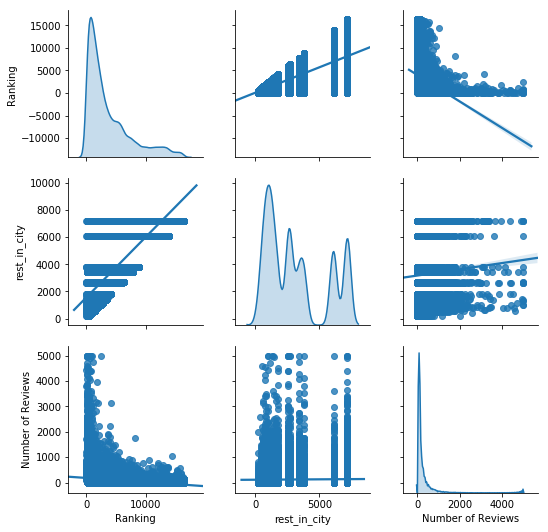

In [60]:
# look at the correlation between ranking, number of restaurant per city & number of reviews
# ranking, number of restaurant per city - have high correlation
display(data[["Ranking","rest_in_city","Number of Reviews"]].corr())
sns.pairplot(data, vars = ["Ranking","rest_in_city","Number of Reviews"], kind = 'reg',diag_kind="kde")

In [61]:
# normalize ranking & number of restaurant
data['norm_rest'] = data['rest_in_city']/data['Ranking']
data['norm_rank'] = data['Ranking']/data['rest_in_city']


### Get polynomial features


In [62]:
# multiply columns where we've seen correlation and try different
pf = PolynomialFeatures(2)
poly_features = pf.fit_transform(data[['rest_in_city', 'Ranking','Number of Reviews']])
col_poly = ['c1','c2','c3','c4', 'c5', 'c6', 'c7', 'c8', 'c9', 'c10']
poly_frame=pd.DataFrame(poly_features, columns=col_poly)
# only c9 makes mae better
data= pd.concat([data, poly_frame['c9']], axis=1)#.drop(['c1'], axis = 1, inplace=True)

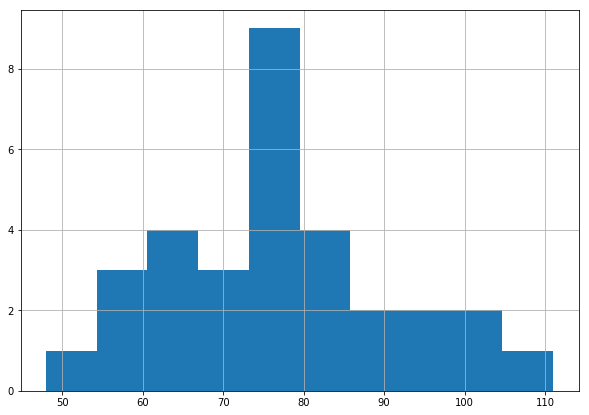

In [63]:
# look at number of unique cuisines per city
data.groupby('City')['Cuisine Style'].apply(lambda x: len(np.unique(np.hstack(x)))).hist()

they have normal distribution

In [64]:
# add number of unique cuisines per city as new feature
data['Cuisine_number_per_city'] = data.groupby('City')['Cuisine Style'].transform(lambda x: len(np.unique(np.hstack(x))))

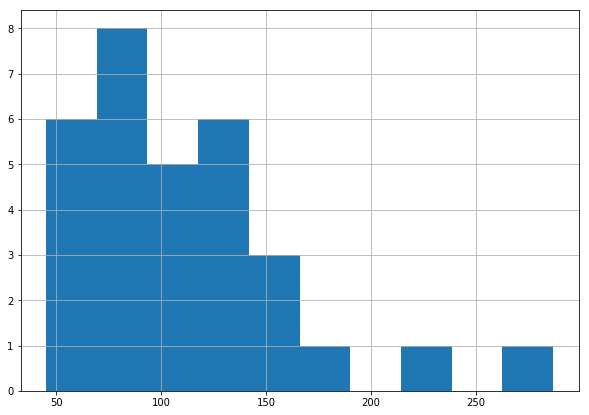

In [65]:
# look at the Number of Reviews per city
data.groupby('City')['Number of Reviews'].apply(lambda x: round(x.mean())).hist()

In [66]:
# add feature mean number of reviews per city - worse mae 
# it has low corr with number of restaurant in city
# data['city_rev_numb'] = data.groupby('City')['Number of Reviews'].transform(lambda x: round(x.mean())).astype(int)

In [67]:
# all these lead to worse mae

# data['norm_price'] = data['New_Price_Range']/data['Cuisine_Style_number']
# data['norm_rank_price'] = data['Ranking']/data['New_Price_Range']
# data['norm_price'] = data['New_Price_Range']/data['Number of Reviews']
# data['norm_rank_rev'] = data['Ranking']/data['Number of Reviews']
# data['dif_day_rank'] = data['Ranking']*data['Review_date_dif']
# data['rank_price'] = data['Ranking']*data['New_Price_Range']
# data['rest_city_price'] = data['rest_in_city']*data['New_Price_Range']
 
# data['last_rev_diff_rank'] = data['Ranking']*data['last_rev_date']
# data['last_rev_diff_rest'] = data['rest_in_city']*data['last_rev_date']
# data['dif_day_norm'] = data['Review_date_dif']/data['rest_in_city']
# data['numb_rev_price'] = data['New_Price_Range']*data['Number of Reviews']
 
# data.drop(['Review_date_dif'], axis = 1, inplace=True)

### Посмотрим распределение целевой переменной

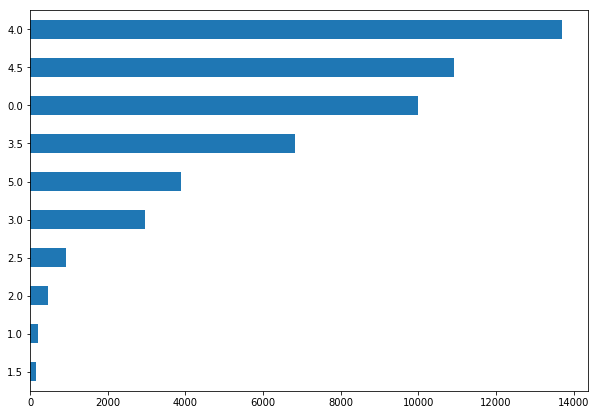

In [68]:
data['Rating'].value_counts(ascending=True).plot(kind='barh')

### Посмотрим распределение целевой переменной относительно признака

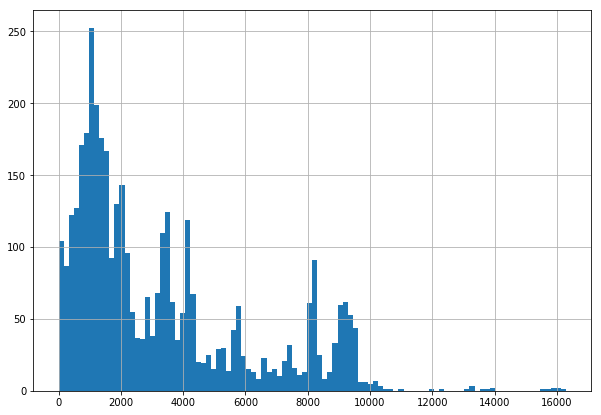

In [69]:
data['Ranking'][data['Rating'] == 5].hist(bins=100)

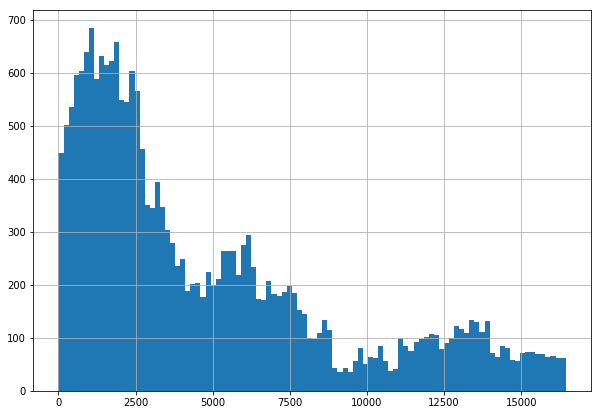

In [70]:
data['Ranking'][data['Rating'] < 4].hist(bins=100)

we could see 3 main waves of ranking distribution 
so will try to add one more ranking normalization

25-й перцентиль: 972.0, 75-й перцентиль: 5241.0, IQR: 4269.0,  Границы выбросов: [-5431.5, 11644.5].


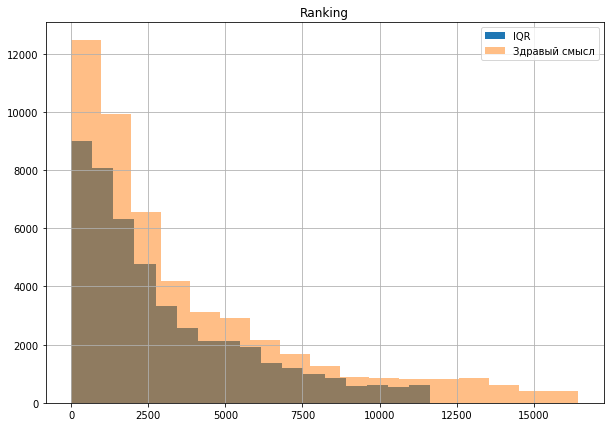

In [71]:
col_name = 'Ranking'
bord = hist_check(data[col_name], 17, tit=col_name, rhb = 25000)

look at the ranking IQR

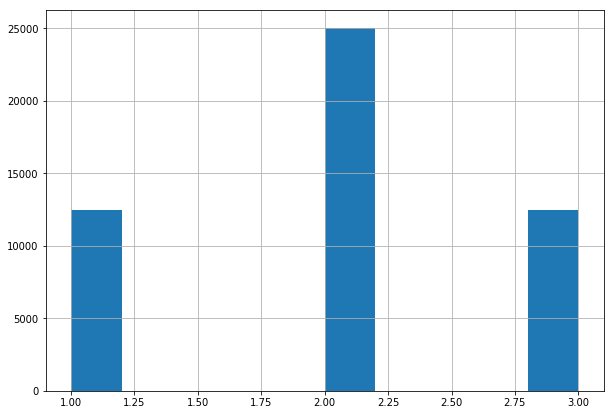

In [72]:
#try to normalize ranking in another way - according to the IQR
data['Ranking_bin'] = np.where(data['Ranking'] > 5241, 3,
                     np.where(data['Ranking'] < 972, 1,2))

data['Ranking_bin'].hist()

In [73]:
# try max city ranking normalizing
data['Ranking_max_norm'] = data['Ranking'] / data['City'].map(data.groupby(['City'])['Ranking'].max())

### City & Restaurant_id dummy variables

In [74]:
# create City dummy variable, no need in nan column  as there is no nan values in that columns
data = pd.get_dummies(data, columns=[ 'City'])

# create Restaurant_id dummy variable
data = pd.get_dummies(data, columns = ['Restaurant_id'])

In [75]:
dummy_col = [col for col in data.columns if ('City_' in col) or ('Restaurant_id_id' in col)]


### Prepare data to run 

In [76]:
# remove not needed columns - lead to worse mae
long_run_data=data.copy()
long_run_data.drop(['Number of Reviews_log','Ranking','Number of Reviews'], axis = 1, inplace=True)
df_preproc = long_run_data.copy().select_dtypes(include=np.number)

### Feature correlation (https://ru.wikipedia.org/wiki/Корреляция)
Look at the all features correlation 

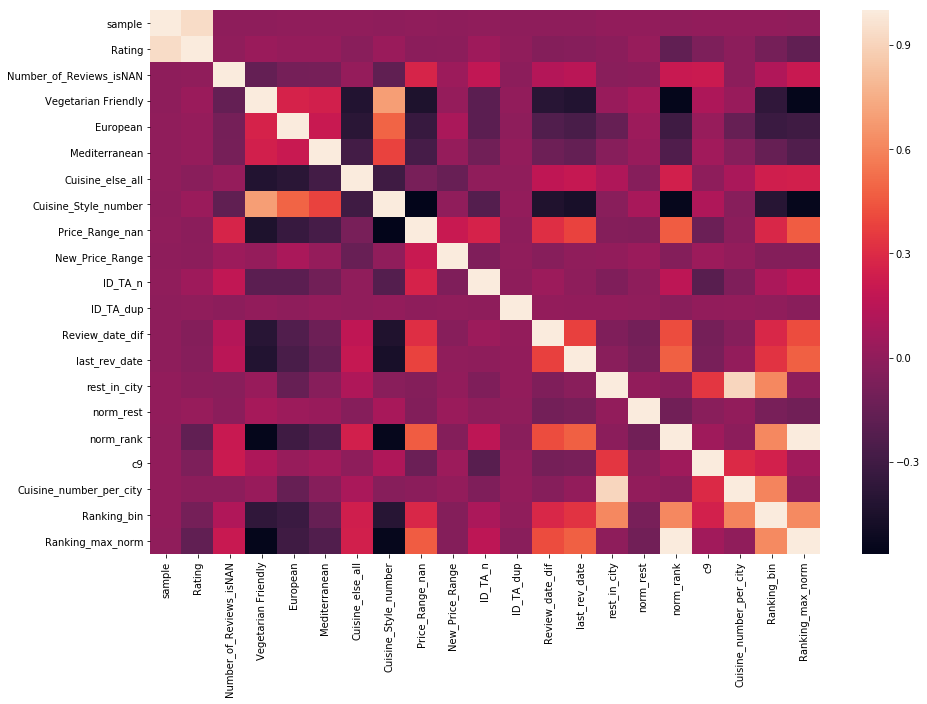

In [77]:
plt.rcParams['figure.figsize'] = (15,10)
sns.heatmap(df_preproc.drop(dummy_col, axis=1).corr(),)

1. There is no highly correlated with Rating features
2. Features don't highly correlate between each other

In [78]:
df_preproc.drop(dummy_col, axis=1).corr()


,sample,Rating,Number_of_Reviews_isNAN,Vegetarian Friendly,European,Mediterranean,Cuisine_else_all,Cuisine_Style_number,Price_Range_nan,New_Price_Range,ID_TA_n,ID_TA_dup,Review_date_dif,last_rev_date,rest_in_city,norm_rest,norm_rank,c9,Cuisine_number_per_city,Ranking_bin,Ranking_max_norm
sample,1.000000,0.936543,-0.003473,-0.003094,0.001291,0.002891,-0.000259,-0.003202,-0.000294,-0.003419,-0.000315,-0.002861,-0.004054,-0.003632,0.004595,0.008299,0.001711,0.008099,0.004176,0.005205,0.001995
Rating,0.936543,1.000000,-0.000631,0.037317,0.016217,0.018614,-0.025136,0.034506,-0.020519,-0.012176,0.049589,0.000034,-0.040434,-0.036332,-0.014779,0.027608,-0.168728,-0.066360,-0.014275,-0.097438,-0.168783
Number_of_Reviews_isNAN,-0.003473,-0.000631,1.000000,-0.159052,-0.097765,-0.088069,0.018752,-0.176198,0.267568,0.040971,0.179165,-0.010067,0.128767,0.155805,-0.024578,-0.017721,0.210182,0.212121,-0.010773,0.117054,0.209631
Vegetarian Friendly,-0.003094,0.037317,-0.159052,1.000000,0.265841,0.244427,-0.418389,0.691530,-0.441819,0.016919,-0.197393,0.008396,-0.396968,-0.423192,0.031122,0.077778,-0.550150,0.106058,0.029091,-0.369066,-0.550901
European,0.001291,0.016217,-0.097765,0.265841,1.000000,0.208640,-0.388209,0.486926,-0.334496,0.094908,-0.192175,-0.003107,-0.234269,-0.262039,-0.153384,0.045425,-0.302817,0.025689,-0.150833,-0.320478,-0.303905
Mediterranean,0.002891,0.018614,-0.088069,0.244427,0.208640,1.000000,-0.288580,0.383432,-0.273434,0.018788,-0.109303,0.012069,-0.129236,-0.157986,-0.032765,0.030163,-0.236162,0.064044,-0.034522,-0.152206,-0.234426
Cuisine_else_all,-0.000259,-0.025136,0.018752,-0.418389,-0.388209,-0.288580,1.000000,-0.304784,-0.083497,-0.149157,0.001766,-0.001054,0.170451,0.194000,0.109948,-0.035468,0.242638,-0.005412,0.094859,0.238056,0.243957
Cuisine_Style_number,-0.003202,0.034506,-0.176198,0.691530,0.486926,0.383432,-0.304784,1.000000,-0.564822,0.002816,-0.220469,0.012472,-0.431447,-0.465489,-0.024105,0.089046,-0.543255,0.112008,-0.032873,-0.400171,-0.543578
Price_Range_nan,-0.000294,-0.020519,0.267568,-0.441819,-0.334496,-0.273434,-0.083497,-0.564822,1.000000,0.208969,0.263877,-0.006223,0.314867,0.385101,-0.045205,-0.047626,0.467034,-0.133974,-0.018377,0.282461,0.465942
New_Price_Range,-0.003419,-0.012176,0.040971,0.016919,0.094908,0.018788,-0.149157,0.002816,0.208969,1.000000,-0.061790,0.001149,-0.031603,-0.002360,0.004841,0.034630,-0.042934,0.041862,0.013940,-0.044973,-0.044051


# Data Preprocessing
Will write everything in one function to make preprocessing faster

In [79]:
# на всякий случай, заново подгружаем данные
df_train = pd.read_csv(DATA_DIR+'/main_task.csv')
df_test = pd.read_csv(DATA_DIR+'/kaggle_task.csv')
df_train['sample'] = 1 # помечаем где у нас трейн
df_test['sample'] = 0 # помечаем где у нас тест
df_test['Rating'] = 0 # в тесте у нас нет значения Rating, мы его должны предсказать, по этому пока просто заполняем нулями

data = df_test.append(df_train, sort=False).reset_index(drop=True) # объединяем
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 50000 entries, 0 to 49999
Data columns (total 11 columns):
Restaurant_id        50000 non-null object
City                 50000 non-null object
Cuisine Style        38410 non-null object
Ranking              50000 non-null float64
Price Range          32639 non-null object
Number of Reviews    46800 non-null float64
Reviews              49998 non-null object
URL_TA               50000 non-null object
ID_TA                50000 non-null object
sample               50000 non-null int64
Rating               50000 non-null float64
dtypes: float64(3), int64(1), object(7)
memory usage: 4.2+ MB


In [80]:
def preproc_data(df_input):
    '''includes several functions to pre-process the predictor data.'''
    
    df_output = df_input.copy()
     
    # number of reviews    
    df_output['Number_of_Reviews_isNAN'] = pd.isna(df_output['Number of Reviews']).astype('uint8')
    df_output['Number of Reviews'] = df_output['Number of Reviews'].apply(lambda x: 5000 if x > 5000 else x)
    df_output["Number of Reviews"] = df_output.groupby("City")['Number of Reviews']\
                                        .transform(lambda x: x.fillna(round(x.mean())))
    
    # cuisine style 
    df_output['Cuisine Style'] = df_output['Cuisine Style']\
                                .apply(lambda x:  np.nan if pd.isna(x) else str(x).strip('[]').replace("'","").split(", "))
    cus_list = df_output['Cuisine Style'].explode().value_counts(ascending=False)[:3].index.tolist()
    for col in cus_list:
        if col not in df_output.columns:
            df_output[col] = df_output['Cuisine Style'].apply(lambda x: 1 if type(x)!=float and col in x   else 0)
    
    df_output['Cuisine_else_all'] = df_output['Cuisine Style']\
                                    .apply(lambda x: 1 if type(x)!=float and all([cus not in cus_list for cus in x])   else 0)
    df_output['Cuisine_Style_number'] = df_output['Cuisine Style']\
                                        .apply(lambda x: 1 if type(x)==float and pd.isna(x)  else len(x))
    
    #encode price range + fill nan's by mean per city & create nan column
    df_output['Price_Range_nan'] = pd.isna(df_output['Price Range']).astype('uint8')
    df_output['New_Price_Range'] = df_output['Price Range'].map({'$$ - $$$':2, '$':1, '$$$$':3})
    df_output['New_Price_Range'] = df_output.groupby("City")['New_Price_Range']\
                                    .transform(lambda x: x.fillna(round(x.mean()))).astype(int)
        
    # id_ta 
    df_output['ID_TA_n'] = df_output.ID_TA.apply(lambda x: x[1:]).astype(str).astype(int)
    df_output['ID_TA_dup'] = dup_col(df_output.ID_TA)
    
    # add review date 
    pat = re.compile('\'\d+\/\d+\/\d+\'?')
    df_output['Review_date'] = df_output.Reviews\
                                .apply(lambda x: [] if pd.isna(x) else re.findall(pat,x) )\
                                .apply(lambda y:[pd.to_datetime(item) for item in y ])
    # add review date diff & rev date nan
    df_output['Review_date_dif'] = df_output.Review_date.apply(lambda x: find_days(x))
    df_output['Review_date_dif'].fillna(round(df_output['Review_date_dif'].mean()), inplace=True)
    
    df_output['last_rev_date'] = df_output.Review_date.apply(lambda x: np.nan if not x else max(x))
    md = max(df_output['last_rev_date'].dropna())
    df_output['last_rev_date'] = df_output['last_rev_date'].apply(lambda x: (md-x).days)
    df_output['last_rev_date'].fillna(round(df_output['last_rev_date'].mean()), inplace=True)
    
    df_output['last_rev_date'] = np.log2(df_output['last_rev_date']+1)
    df_output['Review_date_dif'] = np.log2(df_output['Review_date_dif']+1)
    
    df_output['rest_in_city']=df_output.groupby('City')['Restaurant_id'].transform('count')
    df_output['norm_rest'] = df_output['rest_in_city']/df_output['Ranking']
    df_output['norm_rank'] = df_output['Ranking']/df_output['rest_in_city']
    
    pf = PolynomialFeatures(2)
    poly_features = pf.fit_transform(df_output[['rest_in_city', 'Ranking','Number of Reviews']])
    poly_frame=pd.DataFrame(poly_features, columns=['c1','c2','c3','c4', 'c5', 'c6', 'c7', 'c8', 'c9', 'c10'])
    df_output= pd.concat([df_output, poly_frame['c9']], axis=1)#.drop(['c1'], axis = 1, inplace=True)
    
    df_output['Cuisine_number_per_city'] = df_output.groupby('City')['Cuisine Style']\
                                            .transform(lambda x: len(np.unique(np.hstack(x))))
    
    df_output['Ranking_bin'] = np.where(df_output['Ranking'] > 5241, 3,
                                np.where(df_output['Ranking'] < 972, 1, 2))
    
      
    df_output['Ranking_max_norm'] = df_output['Ranking'] / df_output['City'].map(df_output.groupby(['City'])['Ranking'].max())
    
    df_output.drop(['Ranking','Number of Reviews'], axis = 1, inplace=True)
    
    # dummy City
    # create City dummy variable 
    df_output = pd.get_dummies(df_output, columns=[ 'City',])
    
    # need to be done but not in test - takes a lot of time
    df_output = pd.get_dummies(df_output, columns = ['Restaurant_id'])
    
    
    # ################### 5. Clean #################################################### 
    # select number type columns
    object_columns = [s for s in df_output.columns if df_output[s].dtypes == 'object']
    df_output.drop(object_columns, axis = 1, inplace=True)
    
    return df_output

#### Запускаем и проверяем что получилось

In [81]:
df_preproc = preproc_data(data)
df_preproc.sample(10)


,sample,Rating,Number_of_Reviews_isNAN,Vegetarian Friendly,European,Mediterranean,Cuisine_else_all,Cuisine_Style_number,Price_Range_nan,New_Price_Range,ID_TA_n,ID_TA_dup,Review_date_dif,last_rev_date,rest_in_city,norm_rest,norm_rank,c9,Cuisine_number_per_city,Ranking_bin,Ranking_max_norm,City_Amsterdam,City_Athens,City_Barcelona,City_Berlin,City_Bratislava,City_Brussels,City_Budapest,City_Copenhagen,City_Dublin,City_Edinburgh,City_Geneva,City_Hamburg,City_Helsinki,City_Krakow,City_Lisbon,City_Ljubljana,City_London,City_Luxembourg,City_Lyon,City_Madrid,City_Milan,City_Munich,City_Oporto,City_Oslo,City_Paris,City_Prague,City_Rome,City_Stockholm,City_Vienna,City_Warsaw,City_Zurich,Restaurant_id_id_0,Restaurant_id_id_1,Restaurant_id_id_10,Restaurant_id_id_100,Restaurant_id_id_1000,Restaurant_id_id_10001,Restaurant_id_id_10002,Restaurant_id_id_10003,Restaurant_id_id_10004,Restaurant_id_id_10005,Restaurant_id_id_10006,Restaurant_id_id_10008,Restaurant_id_id_1001,Restaurant_id_id_10011,Restaurant_id_id_10012,Restaurant_id_id_10013,Restaurant_id_id_10014,Restaurant_id_id_10016,Restaurant_id_id_10017,Restaurant_id_id_1002,Restaurant_id_id_10020,Restaurant_id_id_10021,Restaurant_id_id_10022,Restaurant_id_id_10023,Restaurant_id_id_10024,Restaurant_id_id_10025,Restaurant_id_id_10026,Restaurant_id_id_10027,Restaurant_id_id_1003,Restaurant_id_id_10032,Restaurant_id_id_10034,Restaurant_id_id_10036,Restaurant_id_id_10039,Restaurant_id_id_1004,Restaurant_id_id_10040,Restaurant_id_id_10041,Restaurant_id_id_10044,Restaurant_id_id_10045,Restaurant_id_id_10046,Restaurant_id_id_10047,Restaurant_id_id_10049,Restaurant_id_id_1005,Restaurant_id_id_10050,Restaurant_id_id_10051,Restaurant_id_id_10052,Restaurant_id_id_10053,Restaurant_id_id_10054,Restaurant_id_id_10055,Restaurant_id_id_10057,Restaurant_id_id_10059,Restaurant_id_id_1006,Restaurant_id_id_10060,Restaurant_id_id_10061,Restaurant_id_id_10062,Restaurant_id_id_10063,Restaurant_id_id_10065,Restaurant_id_id_10066,Restaurant_id_id_10068,Restaurant_id_id_10069,Restaurant_id_id_1007,Restaurant_id_id_10072,Restaurant_id_id_10073,Restaurant_id_id_10074,Restaurant_id_id_10075,Restaurant_id_id_10079,Restaurant_id_id_1008,Restaurant_id_id_10080,Restaurant_id_id_10081,Restaurant_id_id_10083,Restaurant_id_id_10084,Restaurant_id_id_10088,Restaurant_id_id_10089,Restaurant_id_id_1009,Restaurant_id_id_10092,Restaurant_id_id_10093,Restaurant_id_id_10094,Restaurant_id_id_10095,Restaurant_id_id_10097,Restaurant_id_id_10098,Restaurant_id_id_101,Restaurant_id_id_1010,Restaurant_id_id_10100,Restaurant_id_id_10101,Restaurant_id_id_10102,Restaurant_id_id_10104,Restaurant_id_id_10108,Restaurant_id_id_10109,Restaurant_id_id_1011,Restaurant_id_id_10110,Restaurant_id_id_10111,Restaurant_id_id_10113,Restaurant_id_id_10116,Restaurant_id_id_10117,Restaurant_id_id_10119,Restaurant_id_id_1012,Restaurant_id_id_10120,Restaurant_id_id_10121,Restaurant_id_id_10123,Restaurant_id_id_10125,Restaurant_id_id_10126,Restaurant_id_id_10128,Restaurant_id_id_10129,Restaurant_id_id_1013,Restaurant_id_id_10130,Restaurant_id_id_10131,Restaurant_id_id_10138,Restaurant_id_id_10139,Restaurant_id_id_1014,Restaurant_id_id_10142,Restaurant_id_id_10144,Restaurant_id_id_10148,Restaurant_id_id_1015,Restaurant_id_id_10152,Restaurant_id_id_10155,Restaurant_id_id_10157,Restaurant_id_id_1016,Restaurant_id_id_10160,Restaurant_id_id_10161,Restaurant_id_id_10163,Restaurant_id_id_1017,Restaurant_id_id_10170,Restaurant_id_id_10171,Restaurant_id_id_10174,Restaurant_id_id_10175,Restaurant_id_id_10177,Restaurant_id_id_10179,Restaurant_id_id_1018,Restaurant_id_id_10183,Restaurant_id_id_10184,Restaurant_id_id_10186,Restaurant_id_id_10188,Restaurant_id_id_1019,Restaurant_id_id_10190,Restaurant_id_id_10191,Restaurant_id_id_10192,Restaurant_id_id_10194,Restaurant_id_id_10195,Restaurant_id_id_10197,Restaurant_id_id_102,Restaurant_id_id_1020,Restaurant_id_id_10200,Restaurant_id_id_10201,Restaurant_id_id_10207,Restaurant_id_id_10208,Restaurant_id_id_10209,Restaurant_id_id

In [82]:
df_preproc.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 50000 entries, 0 to 49999
Columns: 13146 entries, sample to Restaurant_id_id_9999
dtypes: float64(7), int64(12), uint8(13127)
memory usage: 633.2 MB


In [83]:
# Теперь выделим тестовую часть
train_data = df_preproc.query('sample == 1').drop(['sample'], axis=1)
test_data = df_preproc.query('sample == 0').drop(['sample'], axis=1)

y = train_data.Rating.values            # наш таргет
X = train_data.drop(['Rating'], axis=1)

**Перед тем как отправлять наши данные на обучение, разделим данные на еще один тест и трейн, для валидации. 
Это поможет нам проверить, как хорошо наша модель работает, до отправки submissiona на kaggle.**

In [84]:
# Воспользуемся специальной функцие train_test_split для разбивки тестовых данных
# выделим 20% данных на валидацию (параметр test_size)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=RANDOM_SEED)

In [85]:
# проверяем
test_data.shape, train_data.shape, X.shape, X_train.shape, X_test.shape

((10000, 13145), (40000, 13145), (40000, 13144), (32000, 13144), (8000, 13144))

# Model 
Сам ML

In [86]:
# Импортируем необходимые библиотеки:
from sklearn.ensemble import RandomForestRegressor # инструмент для создания и обучения модели
from sklearn import metrics # инструменты для оценки точности модели

In [87]:
# Создаём модель (НАСТРОЙКИ НЕ ТРОГАЕМ)
model = RandomForestRegressor(n_estimators=100, verbose=1, n_jobs=-1, random_state=RANDOM_SEED)

In [88]:
# Обучаем модель на тестовом наборе данных
model.fit(X_train, y_train)

# Используем обученную модель для предсказания рейтинга ресторанов в тестовой выборке.
# Предсказанные значения записываем в переменную y_pred
y_pred = model.predict(X_test)

[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done  42 tasks      | elapsed:  2.1min
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:  4.8min finished
[Parallel(n_jobs=4)]: Using backend ThreadingBackend with 4 concurrent workers.
[Parallel(n_jobs=4)]: Done  42 tasks      | elapsed:    0.1s
[Parallel(n_jobs=4)]: Done 100 out of 100 | elapsed:    0.1s finished


In [89]:
# round predicted rating as we have 0.5 step
y_pred = (y_pred * 2).round()/2

In [90]:
# Сравниваем предсказанные значения (y_pred) с реальными (y_test), и смотрим насколько они в среднем отличаются
# Метрика называется Mean Absolute Error (MAE) и показывает среднее отклонение предсказанных значений от фактических.
print('MAE:', metrics.mean_absolute_error(y_test, y_pred))

MAE: 0.158875


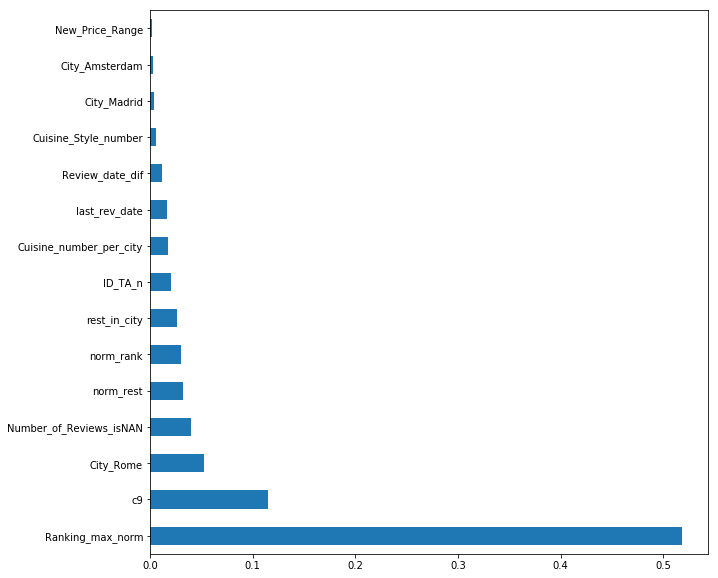

In [91]:
# в RandomForestRegressor есть возможность вывести самые важные признаки для модели
plt.rcParams['figure.figsize'] = (10,10)
feat_importances = pd.Series(model.feature_importances_, index=X.columns)
feat_importances.nlargest(15).plot(kind='barh')

# Submission
Если все устраевает - готовим Submission на кагл

In [92]:
test_data.sample(10)

,Rating,Number_of_Reviews_isNAN,Vegetarian Friendly,European,Mediterranean,Cuisine_else_all,Cuisine_Style_number,Price_Range_nan,New_Price_Range,ID_TA_n,ID_TA_dup,Review_date_dif,last_rev_date,rest_in_city,norm_rest,norm_rank,c9,Cuisine_number_per_city,Ranking_bin,Ranking_max_norm,City_Amsterdam,City_Athens,City_Barcelona,City_Berlin,City_Bratislava,City_Brussels,City_Budapest,City_Copenhagen,City_Dublin,City_Edinburgh,City_Geneva,City_Hamburg,City_Helsinki,City_Krakow,City_Lisbon,City_Ljubljana,City_London,City_Luxembourg,City_Lyon,City_Madrid,City_Milan,City_Munich,City_Oporto,City_Oslo,City_Paris,City_Prague,City_Rome,City_Stockholm,City_Vienna,City_Warsaw,City_Zurich,Restaurant_id_id_0,Restaurant_id_id_1,Restaurant_id_id_10,Restaurant_id_id_100,Restaurant_id_id_1000,Restaurant_id_id_10001,Restaurant_id_id_10002,Restaurant_id_id_10003,Restaurant_id_id_10004,Restaurant_id_id_10005,Restaurant_id_id_10006,Restaurant_id_id_10008,Restaurant_id_id_1001,Restaurant_id_id_10011,Restaurant_id_id_10012,Restaurant_id_id_10013,Restaurant_id_id_10014,Restaurant_id_id_10016,Restaurant_id_id_10017,Restaurant_id_id_1002,Restaurant_id_id_10020,Restaurant_id_id_10021,Restaurant_id_id_10022,Restaurant_id_id_10023,Restaurant_id_id_10024,Restaurant_id_id_10025,Restaurant_id_id_10026,Restaurant_id_id_10027,Restaurant_id_id_1003,Restaurant_id_id_10032,Restaurant_id_id_10034,Restaurant_id_id_10036,Restaurant_id_id_10039,Restaurant_id_id_1004,Restaurant_id_id_10040,Restaurant_id_id_10041,Restaurant_id_id_10044,Restaurant_id_id_10045,Restaurant_id_id_10046,Restaurant_id_id_10047,Restaurant_id_id_10049,Restaurant_id_id_1005,Restaurant_id_id_10050,Restaurant_id_id_10051,Restaurant_id_id_10052,Restaurant_id_id_10053,Restaurant_id_id_10054,Restaurant_id_id_10055,Restaurant_id_id_10057,Restaurant_id_id_10059,Restaurant_id_id_1006,Restaurant_id_id_10060,Restaurant_id_id_10061,Restaurant_id_id_10062,Restaurant_id_id_10063,Restaurant_id_id_10065,Restaurant_id_id_10066,Restaurant_id_id_10068,Restaurant_id_id_10069,Restaurant_id_id_1007,Restaurant_id_id_10072,Restaurant_id_id_10073,Restaurant_id_id_10074,Restaurant_id_id_10075,Restaurant_id_id_10079,Restaurant_id_id_1008,Restaurant_id_id_10080,Restaurant_id_id_10081,Restaurant_id_id_10083,Restaurant_id_id_10084,Restaurant_id_id_10088,Restaurant_id_id_10089,Restaurant_id_id_1009,Restaurant_id_id_10092,Restaurant_id_id_10093,Restaurant_id_id_10094,Restaurant_id_id_10095,Restaurant_id_id_10097,Restaurant_id_id_10098,Restaurant_id_id_101,Restaurant_id_id_1010,Restaurant_id_id_10100,Restaurant_id_id_10101,Restaurant_id_id_10102,Restaurant_id_id_10104,Restaurant_id_id_10108,Restaurant_id_id_10109,Restaurant_id_id_1011,Restaurant_id_id_10110,Restaurant_id_id_10111,Restaurant_id_id_10113,Restaurant_id_id_10116,Restaurant_id_id_10117,Restaurant_id_id_10119,Restaurant_id_id_1012,Restaurant_id_id_10120,Restaurant_id_id_10121,Restaurant_id_id_10123,Restaurant_id_id_10125,Restaurant_id_id_10126,Restaurant_id_id_10128,Restaurant_id_id_10129,Restaurant_id_id_1013,Restaurant_id_id_10130,Restaurant_id_id_10131,Restaurant_id_id_10138,Restaurant_id_id_10139,Restaurant_id_id_1014,Restaurant_id_id_10142,Restaurant_id_id_10144,Restaurant_id_id_10148,Restaurant_id_id_1015,Restaurant_id_id_10152,Restaurant_id_id_10155,Restaurant_id_id_10157,Restaurant_id_id_1016,Restaurant_id_id_10160,Restaurant_id_id_10161,Restaurant_id_id_10163,Restaurant_id_id_1017,Restaurant_id_id_10170,Restaurant_id_id_10171,Restaurant_id_id_10174,Restaurant_id_id_10175,Restaurant_id_id_10177,Restaurant_id_id_10179,Restaurant_id_id_1018,Restaurant_id_id_10183,Restaurant_id_id_10184,Restaurant_id_id_10186,Restaurant_id_id_10188,Restaurant_id_id_1019,Restaurant_id_id_10190,Restaurant_id_id_10191,Restaurant_id_id_10192,Restaurant_id_id_10194,Restaurant_id_id_10195,Restaurant_id_id_10197,Restaurant_id_id_102,Restaurant_id_id_1020,Restaurant_id_id_10200,Restaurant_id_id_10201,Restaurant_id_id_10207,Restaurant_id_id_10208,Restaurant_id_id_10209,Restaurant_id_id_1021,R

In [93]:
test_data = test_data.drop(['Rating'], axis=1)

In [94]:
sample_submission

,Restaurant_id,Rating
0,id_0,2.0
1,id_1,2.5
2,id_2,4.0
3,id_3,1.0
4,id_4,4.0
5,id_5,4.5
6,id_6,4.5
7,id_7,2.0
8,id_8,2.0
9,id_9,3.5


In [95]:
# round predicted rating as we have 0.5 step
predict_submission = model.predict(test_data)
predict_submission = (predict_submission * 2).round()/2

[Parallel(n_jobs=4)]: Using backend ThreadingBackend with 4 concurrent workers.
[Parallel(n_jobs=4)]: Done  42 tasks      | elapsed:    0.1s
[Parallel(n_jobs=4)]: Done 100 out of 100 | elapsed:    0.1s finished


In [96]:
predict_submission

array([3. , 4. , 4.5, ..., 3. , 4.5, 4.5])

In [97]:
sample_submission['Rating'] = predict_submission
sample_submission.to_csv('submission.csv', index=False)
sample_submission.head(10)

,Restaurant_id,Rating
0,id_0,3.0
1,id_1,4.0
2,id_2,4.5
3,id_3,4.5
4,id_4,4.5
5,id_5,4.5
6,id_6,2.5
7,id_7,3.0
8,id_8,4.0
9,id_9,4.5


# Conclusions:
1. Improved pandas skills
2. Tried working in kaggle notebook
3. Improved preprocessing skills
4. Tried Feature Ingineering
5. Tried Feature encoding

# Validation MAE: 0.158875